# # Setup

In [1]:
import numpy as np 
import pandas as pd 

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [2]:
# Setup
!pip -q install ultralytics timm
import ultralytics
ultralytics.checks()

import os, cv2, json, yaml, math, gc, random, shutil, contextlib
from pathlib import Path
from PIL import Image

import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from tqdm.auto import tqdm
from ultralytics import YOLO
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from collections import Counter
from sklearn.cluster import KMeans
from collections import Counter, defaultdict

device = "cuda" if torch.cuda.is_available() else "cpu"
torch.manual_seed(42)
print("Device:", device, "| torch", torch.__version__)

def autocast_ctx():
    return torch.autocast(device_type="cuda", enabled=True) if device=="cuda" else contextlib.nullcontext()

Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6582.3/8062.4 GB disk)
Device: cuda | torch 2.8.0+cu126


# COCO dataset from roboflow

In [3]:
!pip install roboflow
from roboflow import Roboflow
%pip install ultralytics supervision roboflow

rf = Roboflow(api_key="kb3t7HveaF3ISN0TEWpk")
project = rf.workspace("palm-oil-vj5ii").project("dat-palm-fx-vfhm6")
version = project.version(1)
dataset = version.download("coco")

print("Downloaded dataset to:", dataset.location)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 40.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 69.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 109.8 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.26.0 requires google-cloud-bigquery-storage<3.0.0,>=2.


Extracting Dataset Version Zip to Dat-Palm-Fx-1 in coco:: 100%|██████████| 4810/4810 [00:01<00:00, 2978.64it/s]


Downloaded dataset to: /kaggle/working/Dat-Palm-Fx-1


In [4]:
from pathlib import Path
# Base Kaggle working dir
BASE = Path("/kaggle/working")

# Roboflow dataset directory 
DATASET_DIR = BASE / "Dat-Palm-Fx-1"

# Your project workspace
WORK  = BASE / "palm_byol_ssl"     
SPLIT = WORK / "0_yolo_split"
DATA  = WORK / "data_byol.yaml"

# SSL backbone weights
SSL_W = WORK / "byol_backbone_with_hooks_yolov12.pt"

# Path for YOLOv12s weights 
YOL0V12S_W = WORK / "yolov12s.pt"    

# Create needed directories
WORK.mkdir(parents=True, exist_ok=True)
SPLIT.mkdir(parents=True, exist_ok=True)

print("BASE        :", BASE)
print("DATASET_DIR :", DATASET_DIR)
print("WORK        :", WORK)
print("SPLIT       :", SPLIT)
print("DATA        :", DATA)
print("SSL_W       :", SSL_W)
print("YOL0V12S_W  :", YOL0V12S_W)

BASE        : /kaggle/working
DATASET_DIR : /kaggle/working/Dat-Palm-Fx-1
WORK        : /kaggle/working/palm_byol_ssl
SPLIT       : /kaggle/working/palm_byol_ssl/0_yolo_split
DATA        : /kaggle/working/palm_byol_ssl/data_byol.yaml
SSL_W       : /kaggle/working/palm_byol_ssl/byol_backbone_with_hooks_yolov12.pt
YOL0V12S_W  : /kaggle/working/palm_byol_ssl/yolov12s.pt


In [5]:
from pathlib import Path
import json, shutil, yaml


BASE        = Path("/kaggle/working")
DATASET_DIR = BASE / "Dat-Palm-Fx-1"          

WORK  = BASE / "palm_byol_ssl"
SPLIT = WORK / "0_yolo_split"
DATA  = WORK / "data_byol.yaml"

SSL_W      = WORK / "byol_backbone_with_hooks_yolov12.pt"
YOL0V12S_W = WORK / "yolov12s.pt"

WORK.mkdir(parents=True, exist_ok=True)


def coco2yolo(b, w, h):
    x, y, bw, bh = b
    return (x + bw/2) / w, (y + bh/2) / h, bw / w, bh / h


train_ann_path = DATASET_DIR / "train" / "_annotations.coco.json"
if not train_ann_path.exists():
    raise FileNotFoundError(f"Train annotation file not found: {train_ann_path}")

train_coco = json.load(open(train_ann_path, "r"))
all_categories = sorted(train_coco.get("categories", []), key=lambda x: x["id"])
present_cat_ids = set(a["category_id"] for a in train_coco.get("annotations", []))

# Filter categories to those present in train annotations
categories = [c for c in all_categories if c["id"] in present_cat_ids]

# Warn about any categories that exist but have zero instances
empty_cats = [c for c in all_categories if c["id"] not in present_cat_ids]
if empty_cats:
    print(" The following categories exist in 'categories' but have zero instances in train annotations:")
    for c in empty_cats:
        print(f"   id={c['id']}\tname={c['name']}")
    print("They will be excluded from the YOLO mapping (nc will decrease).")

# Create mapping: original category_id 
id2new = {cat["id"]: i for i, cat in enumerate(categories)}
print("Using category mapping (original id -> new index):")
for orig, new in id2new.items():
    print(f"   {orig} -> {new}")


def convert(split_name, img_dir, ann_json_path):
    out_im = SPLIT / split_name / "images"
    out_lb = SPLIT / split_name / "labels"
    out_im.mkdir(parents=True, exist_ok=True)
    out_lb.mkdir(parents=True, exist_ok=True)

    ann_json_path = Path(ann_json_path)
    if not ann_json_path.exists():
        raise FileNotFoundError(f"Annotations file not found: {ann_json_path}")

    coco = json.load(open(ann_json_path, "r"))
    # build image id -> info map
    id2img = {
        im["id"]: {
            k: im[k] for k in ("id", "file_name", "width", "height")
        }
        for im in coco["images"]
    }

    skipped_annotations = 0
    for ann in coco["annotations"]:
        orig_cat = ann["category_id"]
        if orig_cat not in id2new:
           
            skipped_annotations += 1
            continue

        img = id2img[ann["image_id"]]
        yb = coco2yolo(ann["bbox"], img["width"], img["height"])
        cls = id2new[orig_cat]

        lbl_path = out_lb / f"{Path(img['file_name']).stem}.txt"
        with open(lbl_path, "a") as f:
            f.write(f"{cls} " + " ".join(f"{v:.6f}" for v in yb) + "\n")

    if skipped_annotations:
        print(f" Skipped {skipped_annotations} annotations because their category_id is not in the train mapping.")

    # copy images
    img_dir = Path(img_dir)
    missing = 0
    for im in coco["images"]:
        src = img_dir / im["file_name"]
        if src.exists():
            shutil.copy(src, out_im / im["file_name"])
        else:
            missing += 1

    if missing:
        print(f" {missing} image files missing from {img_dir} (referenced in annotations but not found).")


if SPLIT.exists():
    shutil.rmtree(SPLIT)
    print("Old YOLO split removed:", SPLIT)

print("➤ Converting COCO → YOLO …")
convert("train", DATASET_DIR / "train", DATASET_DIR / "train" / "_annotations.coco.json")
convert("valid", DATASET_DIR / "valid", DATASET_DIR / "valid" / "_annotations.coco.json")
convert("test",  DATASET_DIR / "test",  DATASET_DIR / "test"  / "_annotations.coco.json")

# write data.yaml (names ordered by our remapping 'categories')
names = [c["name"] for c in categories]
DATA.parent.mkdir(parents=True, exist_ok=True)
DATA.write_text(yaml.dump({
    "path": str(SPLIT),
    "train": "train/images",
    "val": "valid/images",
    "test": "test/images",
    "nc": len(names),
    "names": names
}, sort_keys=False))

print("✓ YOLO split ready at", SPLIT)


 The following categories exist in 'categories' but have zero instances in train annotations:
   id=0	name=palms-obj
They will be excluded from the YOLO mapping (nc will decrease).
Using category mapping (original id -> new index):
   1 -> 0
   2 -> 1
   3 -> 2
Old YOLO split removed: /kaggle/working/palm_byol_ssl/0_yolo_split
➤ Converting COCO → YOLO …
✓ YOLO split ready at /kaggle/working/palm_byol_ssl/0_yolo_split


# Sample Training Images with YOLO Annotations

Classes: ['abnormal_palm', 'dead_palm', 'healthy_palm']


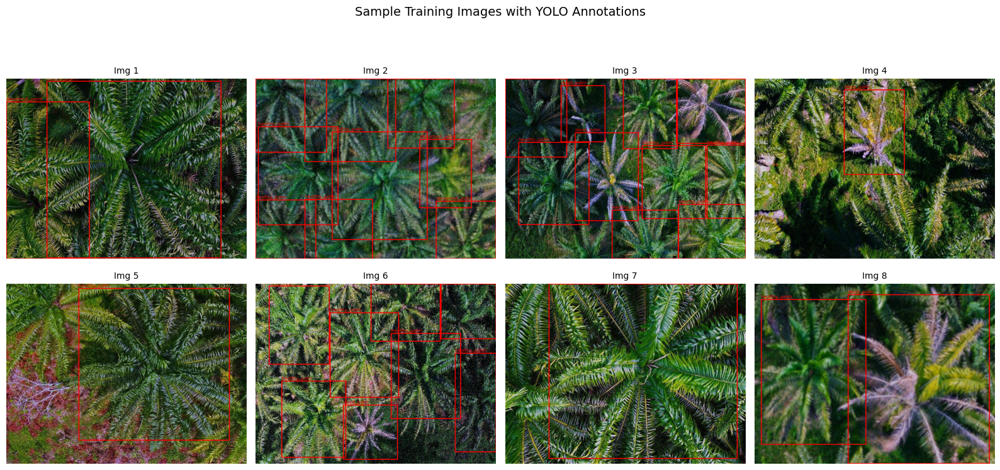

In [6]:
from pathlib import Path
import math, random
import matplotlib.pyplot as plt
import cv2
import yaml


BASE        = Path("/kaggle/working")
DATASET_DIR = BASE / "Dat-Palm-Fx-1"         

WORK  = BASE / "palm_byol_ssl"
SPLIT = WORK / "0_yolo_split"
DATA  = WORK / "data_byol.yaml"

SSL_W      = WORK / "byol_backbone_with_hooks_yolov12.pt"
YOL0V12S_W = WORK / "yolov12s.pt"


with open(DATA, "r") as f:
    data_cfg = yaml.safe_load(f)
class_names = data_cfg["names"]
print("Classes:", class_names)


#  Helper functions

def load_yolo_labels(lbl_path):
    boxes = []
    if not lbl_path.exists():
        return boxes
    with open(lbl_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            cls = int(parts[0])
            x_c, y_c, w, h = map(float, parts[1:])
            boxes.append((cls, x_c, y_c, w, h))
    return boxes

def draw_yolo_boxes(img_path, lbl_path, class_names):
    img = cv2.imread(str(img_path))
    if img is None:
        return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    boxes = load_yolo_labels(lbl_path)
    for cls, x_c, y_c, bw, bh in boxes:
        # YOLO (normalized) -> pixel coords
        x_c_abs = x_c * w
        y_c_abs = y_c * h
        bw_abs = bw * w
        bh_abs = bh * h

        x1 = int(x_c_abs - bw_abs / 2)
        y1 = int(y_c_abs - bh_abs / 2)
        x2 = int(x_c_abs + bw_abs / 2)
        y2 = int(y_c_abs + bh_abs / 2)

        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cls_name = class_names[cls] if cls < len(class_names) else str(cls)
        cv2.putText(img, cls_name, (x1, max(0, y1 - 5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1, cv2.LINE_AA)
    return img


train_img_dir = SPLIT / "train" / "images"
train_lbl_dir = SPLIT / "train" / "labels"

all_imgs = list(train_img_dir.glob("*.jpg")) + list(train_img_dir.glob("*.png"))
random.shuffle(all_imgs)
n_show = min(8, len(all_imgs))

cols = 4
rows = math.ceil(n_show / cols)

fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
axes = axes.flatten() if rows * cols > 1 else [axes]

for i in range(rows * cols):
    ax = axes[i]
    ax.axis("off")

    if i >= n_show:
        continue

    img_path = all_imgs[i]
    lbl_path = train_lbl_dir / (img_path.stem + ".txt")
    vis = draw_yolo_boxes(img_path, lbl_path, class_names)

    if vis is None:
        continue

    ax.imshow(vis)
    ax.set_title(f"Img {i+1}", fontsize=10)

fig.suptitle("Sample Training Images with YOLO Annotations", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Data Agmentation

In [7]:
!pip install -q albumentations==1.4.7

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.7/155.7 kB 6.2 MB/s eta 0:00:00


In [8]:
from pathlib import Path
import cv2
import shutil
import yaml
from tqdm import tqdm
import albumentations as A


BASE  = Path("/kaggle/working")
WORK  = BASE / "palm_byol_ssl"
SPLIT = WORK / "0_yolo_split"          
DATA  = WORK / "data_byol.yaml"        

# New augmented dataset root
AUG_SPLIT = WORK / "0_yolo_split_aug"

# fresh start: delete old aug dir if exists
if AUG_SPLIT.exists():
    shutil.rmtree(AUG_SPLIT)
AUG_SPLIT.mkdir(parents=True, exist_ok=True)

print("Original split :", SPLIT)
print("Augmented split:", AUG_SPLIT)


def sanitize_box(xc, yc, w, h, eps=1e-6):
    """
    Clamp YOLO box (xc, yc, w, h) so that the *corners* are inside [0,1].
    If the box becomes degenerate (too small), return None.
    """
    if w <= 0 or h <= 0:
        return None

    # convert to corner coords
    x1 = xc - w / 2.0
    y1 = yc - h / 2.0
    x2 = xc + w / 2.0
    y2 = yc + h / 2.0

    # clamp corners to [0,1]
    x1 = max(0.0, min(1.0, x1))
    y1 = max(0.0, min(1.0, y1))
    x2 = max(0.0, min(1.0, x2))
    y2 = max(0.0, min(1.0, y2))

    # ensure valid non-zero box
    if x2 - x1 < eps or y2 - y1 < eps:
        return None

    # back to YOLO format
    xc = (x1 + x2) / 2.0
    yc = (y1 + y2) / 2.0
    w  = (x2 - x1)
    h  = (y2 - y1)

    return xc, yc, w, h


def clean_label_file(lbl_path):
    """Read a YOLO txt, clamp all boxes to [0,1], rewrite."""
    if not lbl_path.exists():
        return
    new_lines = []
    with open(lbl_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            cls = int(parts[0])
            x_c, y_c, w, h = map(float, parts[1:])
            sanitized = sanitize_box(x_c, y_c, w, h)
            if sanitized is None:
                continue
            x_c, y_c, w, h = sanitized
            new_lines.append(f"{cls} {x_c:.6f} {y_c:.6f} {w:.6f} {h:.6f}\n")

    with open(lbl_path, "w") as f:
        for ln in new_lines:
            f.write(ln)


def clean_all_labels():
    """Clean labels in train/valid/test of the original SPLIT."""
    for split in ["train", "valid", "test"]:
        lbl_dir = SPLIT / split / "labels"
        if not lbl_dir.exists():
            continue
        print(f"Cleaning labels in: {lbl_dir}")
        for lbl_path in tqdm(list(lbl_dir.glob("*.txt"))):
            clean_label_file(lbl_path)

clean_all_labels()
print("All original labels sanitized with corner-clamping.")


#YOLO label helpers

def load_yolo_labels(lbl_path):
    """
    Load YOLO labels from a TXT file.
    Returns: list of (cls, x_c, y_c, w, h) with normalized coordinates.
    """
    boxes = []
    if not lbl_path.exists():
        return boxes
    with open(lbl_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            cls = int(parts[0])
            x_c, y_c, w, h = map(float, parts[1:])
            sanitized = sanitize_box(x_c, y_c, w, h)
            if sanitized is None:
                continue
            x_c, y_c, w, h = sanitized
            boxes.append((cls, x_c, y_c, w, h))
    return boxes


def save_yolo_labels(lbl_path, boxes):
    """Save list of (cls, x_c, y_c, w, h) to YOLO txt file."""
    with open(lbl_path, "w") as f:
        for cls, x_c, y_c, w, h in boxes:
            f.write(f"{cls} {x_c:.6f} {y_c:.6f} {w:.6f} {h:.6f}\n")


# Albumentations augmentation pipeline

train_transform = A.Compose(
    [
        # Geometric
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.Rotate(limit=15, border_mode=cv2.BORDER_REFLECT_101, p=0.5),

        # Photometric
        A.HueSaturationValue(
            hue_shift_limit=10,
            sat_shift_limit=50,
            val_shift_limit=30,
            p=0.7,
        ),
        A.RandomBrightnessContrast(
            brightness_limit=0.2,
            contrast_limit=0.2,
            p=0.7,
        ),
        A.GaussianBlur(blur_limit=(3, 7), p=0.3),
    ],
    bbox_params=A.BboxParams(
        format="yolo",          # (x_c, y_c, w, h), normalized
        label_fields=["class_labels"],
        min_visibility=0.3,
    ),
)


MAX_AUG_IMAGES = 1000   

def augment_split(split_name, n_aug_per_image=3):
    """
    split_name: 'train', 'valid', or 'test'
    n_aug_per_image: how many augmented copies to create per original image
                     (only used for 'train'; val/test will just be copied)
    """
    src_img_dir = SPLIT / split_name / "images"
    src_lbl_dir = SPLIT / split_name / "labels"

    dst_img_dir = AUG_SPLIT / split_name / "images"
    dst_lbl_dir = AUG_SPLIT / split_name / "labels"
    dst_img_dir.mkdir(parents=True, exist_ok=True)
    dst_lbl_dir.mkdir(parents=True, exist_ok=True)

    img_files = list(src_img_dir.glob("*.jpg")) + list(src_img_dir.glob("*.png"))
    print(f"[{split_name}] Found {len(img_files)} images")

    aug_count = 0  # only augmented images (train)

    for img_path in tqdm(img_files):
        stem = img_path.stem
        lbl_path = src_lbl_dir / f"{stem}.txt"

        # 1) ALWAYS copy original image + label (train/valid/test)
        dst_img = dst_img_dir / img_path.name
        dst_lbl = dst_lbl_dir / f"{stem}.txt"
        shutil.copy2(img_path, dst_img)
        if lbl_path.exists():
            shutil.copy2(lbl_path, dst_lbl)

        # 2) Only train gets augmentation
        if split_name != "train":
            continue

        
        if n_aug_per_image <= 0 or aug_count >= MAX_AUG_IMAGES:
            continue

        # 4) Load for augmentation
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        boxes = load_yolo_labels(lbl_path)
        if not boxes:
            continue

        bboxes = [[b[1], b[2], b[3], b[4]] for b in boxes]
        class_labels = [b[0] for b in boxes]

        # 5) Create augmented copies
        for k in range(n_aug_per_image):
            if aug_count >= MAX_AUG_IMAGES:
                break

            augmented = train_transform(
                image=img,
                bboxes=bboxes,
                class_labels=class_labels,
            )

            aug_img = augmented["image"]
            aug_bboxes = augmented["bboxes"]
            aug_labels = augmented["class_labels"]

            # if all boxes got dropped, skip this example
            if len(aug_bboxes) == 0:
                continue

            new_stem = f"{stem}_aug{k+1}"
            out_img_path = dst_img_dir / f"{new_stem}.jpg"
            out_lbl_path = dst_lbl_dir / f"{new_stem}.txt"

            # save image
            aug_img_bgr = cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR)
            cv2.imwrite(str(out_img_path), aug_img_bgr)

            # save labels in YOLO format (sanitize once more, just in case)
            new_boxes = []
            for cls, (xc, yc, bw, bh) in zip(aug_labels, aug_bboxes):
                sanitized = sanitize_box(xc, yc, bw, bh)
                if sanitized is None:
                    continue
                xc, yc, bw, bh = sanitized
                new_boxes.append((cls, xc, yc, bw, bh))

            if new_boxes:
                save_yolo_labels(out_lbl_path, new_boxes)
                aug_count += 1  # ekta augmented image save holo

    print(
        f"[{split_name}] Done. Images in augmented split:",
        len(list(dst_img_dir.glob('*.jpg'))) + len(list(dst_img_dir.glob('*.png'))),
        f"(augmented images in train ≈ {aug_count if split_name=='train' else 0})"
    )


augment_split("train", n_aug_per_image=3)   # original sob + ~1000 aug
augment_split("valid", n_aug_per_image=0)   # only copy originals
augment_split("test",  n_aug_per_image=0)   # only copy originals


with open(DATA, "r") as f:
    cfg = yaml.safe_load(f)

cfg_aug = cfg.copy()
cfg_aug["path"]  = str(AUG_SPLIT)    
cfg_aug["train"] = "train/images"
cfg_aug["val"]   = "valid/images"
cfg_aug["test"]  = "test/images"

DATA_AUG = WORK / "data_byol_augmented.yaml"
with open(DATA_AUG, "w") as f:
    yaml.safe_dump(cfg_aug, f, sort_keys=False)

print("Augmented yaml written to:", DATA_AUG)
print("Augmentation finished.")

INFO:albumentations.check_version:A new version of Albumentations is available: 2.0.8 (you have 1.4.7). Upgrade using: pip install --upgrade albumentations


Original split : /kaggle/working/palm_byol_ssl/0_yolo_split
Augmented split: /kaggle/working/palm_byol_ssl/0_yolo_split_aug
Cleaning labels in: /kaggle/working/palm_byol_ssl/0_yolo_split/train/labels


100%|██████████| 3855/3855 [00:00<00:00, 9046.87it/s]


Cleaning labels in: /kaggle/working/palm_byol_ssl/0_yolo_split/valid/labels


100%|██████████| 200/200 [00:00<00:00, 7617.97it/s]


Cleaning labels in: /kaggle/working/palm_byol_ssl/0_yolo_split/test/labels


100%|██████████| 747/747 [00:00<00:00, 9706.15it/s]


All original labels sanitized with corner-clamping.
[train] Found 3855 images


100%|██████████| 3855/3855 [00:15<00:00, 247.71it/s] 


[train] Done. Images in augmented split: 4855 (augmented images in train ≈ 1000)
[valid] Found 200 images


100%|██████████| 200/200 [00:00<00:00, 2567.24it/s]


[valid] Done. Images in augmented split: 200 (augmented images in train ≈ 0)
[test] Found 747 images


100%|██████████| 747/747 [00:00<00:00, 2632.18it/s]

[test] Done. Images in augmented split: 747 (augmented images in train ≈ 0)
Augmented yaml written to: /kaggle/working/palm_byol_ssl/data_byol_augmented.yaml
Augmentation finished.


# Data Distribution before and after Agmentation

In [9]:
from pathlib import Path

def count_images(root_dir: Path):
    counts = {}
    for split in ["train", "valid", "test"]:
        img_dir = root_dir / split / "images"
        if not img_dir.exists():
            counts[split] = 0
        else:
            counts[split] = (
                len(list(img_dir.glob("*.jpg"))) +
                len(list(img_dir.glob("*.png")))
            )
    return counts

before = count_images(SPLIT)
after  = count_images(AUG_SPLIT)

print(" Image counts BEFORE augmentation (SPLIT)")
for split, c in before.items():
    print(f"{split:5s}: {c}")

print("\n Image counts AFTER augmentation (AUG_SPLIT)")
for split, c in after.items():
    print(f"{split:5s}: {c}")

print("\n Increase (after - before) ")
for split in ["train", "valid", "test"]:
    inc = after[split] - before[split]
    print(f"{split:5s}: {inc:+d}")

 Image counts BEFORE augmentation (SPLIT)
train: 3855
valid: 200
test : 747

 Image counts AFTER augmentation (AUG_SPLIT)
train: 4855
valid: 200
test : 747

 Increase (after - before) 
train: +1000
valid: +0
test : +0


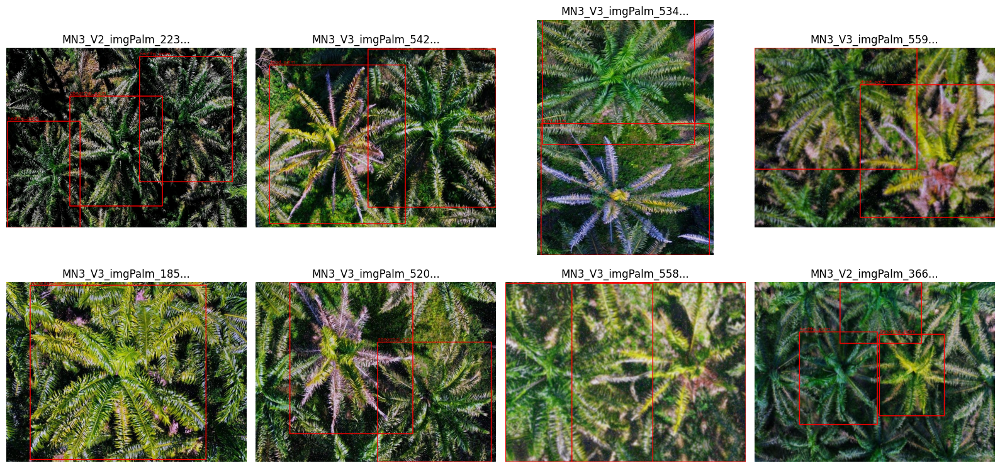

In [10]:
from pathlib import Path
import random, math
import cv2
import matplotlib.pyplot as plt
import yaml

BASE = Path("/kaggle/working")
WORK = BASE / "palm_byol_ssl"
AUG_SPLIT = WORK / "0_yolo_split_aug"


split = "train"

img_dir = AUG_SPLIT / split / "images"
lbl_dir = AUG_SPLIT / split / "labels"


data_aug_yaml = WORK / "data_byol_augmented.yaml"
with open(data_aug_yaml, "r") as f:
    cfg = yaml.safe_load(f)
class_names = cfg["names"]

def load_yolo_labels(lbl_path):
    boxes = []
    if not lbl_path.exists():
        return boxes
    with open(lbl_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            cls = int(parts[0])
            x_c, y_c, w, h = map(float, parts[1:])
            boxes.append((cls, x_c, y_c, w, h))
    return boxes

def draw_boxes(img_path, lbl_path):
    img = cv2.imread(str(img_path))
    if img is None:
        return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    boxes = load_yolo_labels(lbl_path)

    for cls, xc, yc, bw, bh in boxes:
        x1 = int((xc - bw/2) * w)
        y1 = int((yc - bh/2) * h)
        x2 = int((xc + bw/2) * w)
        y2 = int((yc + bh/2) * h)
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        name = class_names[cls] if cls < len(class_names) else str(cls)
        cv2.putText(img, name, (x1, max(0, y1-5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)
    return img

all_imgs = list(img_dir.glob("*.jpg")) + list(img_dir.glob("*.png"))
random.shuffle(all_imgs)
n_show = min(8, len(all_imgs))

cols = 4
rows = math.ceil(n_show / cols)
plt.figure(figsize=(4*cols, 4*rows))

for i, p in enumerate(all_imgs[:n_show]):
    lbl = lbl_dir / (p.stem + ".txt")
    vis = draw_boxes(p, lbl)
    if vis is None:
        continue
    plt.subplot(rows, cols, i+1)
    plt.imshow(vis)
    plt.axis("off")
    plt.title(p.name[:18] + "...")

plt.tight_layout()
plt.show()

In [11]:
import math
import gc
import random

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from torchvision import transforms
from PIL import Image

import pandas as pd
import matplotlib.pyplot as plt

from ultralytics import YOLO
from IPython.display import Image as IPyImage, display

BASE        = Path("/kaggle/working")
WORK        = BASE / "palm_byol_ssl"

# Original split + yaml 
SPLIT       = WORK / "0_yolo_split"
DATA        = WORK / "data_byol.yaml"

# Augmented split + yaml 
AUG_SPLIT   = WORK / "0_yolo_split_aug"
DATA_AUG    = WORK / "data_byol_augmented.yaml"

# BYOL SSL weights for YOLOv12s backbone+neck
SSL_W       = WORK / "byol_backbone_with_hooks_yolov12s.pt"

# YOLOv12s model config 
MODEL_CFG   = "yolov12s.yaml"

# Device
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)
print("Original split:", SPLIT)
print("Augmented split:", AUG_SPLIT)
print("Augmented data yaml:", DATA_AUG)

Device: cuda
Original split: /kaggle/working/palm_byol_ssl/0_yolo_split
Augmented split: /kaggle/working/palm_byol_ssl/0_yolo_split_aug
Augmented data yaml: /kaggle/working/palm_byol_ssl/data_byol_augmented.yaml


# BYOL-style augmentations for SSL pretrain

In [12]:
# BYOL-style augmentations for SSL pretrain
BYOL_IMG_SIZE = 160 

byol_transform = transforms.Compose([
    transforms.RandomResizedCrop(BYOL_IMG_SIZE, scale=(0.2, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomApply(
        [transforms.ColorJitter(0.4, 0.4, 0.4, 0.1)],
        p=0.8,
    ),
    transforms.RandomGrayscale(p=0.2),
    transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
    transforms.ToTensor(),
    # Normalization (ImageNet style; fine for SSL)
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])


class TwoView(Dataset):
 
    def __init__(self, image_dirs, transform):
        self.image_paths = []
        for d in image_dirs:
            d = Path(d)
            self.image_paths += sorted(
                list(d.glob("*.jpg")) +
                list(d.glob("*.png")) +
                list(d.glob("*.jpeg"))
            )
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        img = Image.open(img_path).convert("RGB")
        v1 = self.transform(img)
        v2 = self.transform(img)
        return v1, v2


# Use AUGMENTED train + valid images for SSL pretraining
ssl_image_dirs = [
    AUG_SPLIT / "train" / "images",
    AUG_SPLIT / "valid" / "images"
]
print("SSL image dirs:", ssl_image_dirs)

SSL image dirs: [PosixPath('/kaggle/working/palm_byol_ssl/0_yolo_split_aug/train/images'), PosixPath('/kaggle/working/palm_byol_ssl/0_yolo_split_aug/valid/images')]


# BYOL helpers (loss, hooks, pooling, detect-head finder)

In [13]:
# BYOL loss
def byol_loss(p, z):
    # p, z: [B, D]
    p = F.normalize(p, dim=1)
    z = F.normalize(z, dim=1)
    return 2 - 2 * (p * z).sum(dim=1).mean()



# Hook to capture neck outputs

class DetectInputHook:
    def __init__(self, detect_module):
        self.handle = detect_module.register_forward_pre_hook(self.hook)
        self.feats = None

    def hook(self, module, inputs):
        
        self.feats = list(inputs[0])  
        return None

    def close(self):
        self.handle.remove()


def global_pool_concat(feats):
    """
    feats: list of feature maps [B, C_i, H_i, W_i]
    Returns pooled: [B, sum_i C_i]
    """
    pooled = [F.adaptive_avg_pool2d(f, 1).flatten(1) for f in feats]
    return torch.cat(pooled, dim=1)


def get_detect_module(model_module):
    """
    Return the Detect head (robust across YOLO versions).
    model_module is the underlying DetectionModel (YOLO(...).model)
    """
    try:
        last = model_module.model[-1]
        if "Detect" in last.__class__.__name__:
            return last
    except Exception:
        pass

    cand = None
    for m in model_module.modules():
        if "Detect" in m.__class__.__name__:
            cand = m
    return cand if cand is not None else list(model_module.modules())[-1]

# BYOL pretraining on YOLOv12s backbone + neck


🔄  BYOL pre-training YOLOv12s backbone on augmented data


`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.


Backbone feature dim: 896


Epoch 1/70 BYOL loss=0.2536


Epoch 2/70 BYOL loss=0.1221


Epoch 3/70 BYOL loss=0.1009


Epoch 4/70 BYOL loss=0.0855


Epoch 5/70 BYOL loss=0.0928


Epoch 6/70 BYOL loss=0.0953


Epoch 7/70 BYOL loss=0.0717


Epoch 8/70 BYOL loss=0.0625


Epoch 9/70 BYOL loss=0.0823


Epoch 10/70 BYOL loss=0.0775


Epoch 11/70 BYOL loss=0.0798


Epoch 12/70 BYOL loss=0.0550


Epoch 13/70 BYOL loss=0.0524


Epoch 14/70 BYOL loss=0.0623


Epoch 15/70 BYOL loss=0.0577


Epoch 16/70 BYOL loss=0.0538


Epoch 17/70 BYOL loss=0.0511


Epoch 18/70 BYOL loss=0.0567


Epoch 19/70 BYOL loss=0.0597


Epoch 20/70 BYOL loss=0.0631


Epoch 21/70 BYOL loss=0.0596


Epoch 22/70 BYOL loss=0.0787


Epoch 23/70 BYOL loss=0.0812


Epoch 24/70 BYOL loss=0.0992


Epoch 25/70 BYOL loss=0.1078


Epoch 26/70 BYOL loss=0.0913


Epoch 27/70 BYOL loss=0.0852


Epoch 28/70 BYOL loss=0.0871


Epoch 29/70 BYOL loss=0.1004


Epoch 30/70 BYOL loss=0.1025


Epoch 31/70 BYOL loss=0.0987


Epoch 32/70 BYOL loss=0.0927


Epoch 33/70 BYOL loss=0.0976


Epoch 34/70 BYOL loss=0.0936


Epoch 35/70 BYOL loss=0.0924


Epoch 36/70 BYOL loss=0.0901


Epoch 37/70 BYOL loss=0.0933


Epoch 38/70 BYOL loss=0.1018


Epoch 39/70 BYOL loss=0.1098


Epoch 40/70 BYOL loss=0.1249


Epoch 41/70 BYOL loss=0.1279


Epoch 42/70 BYOL loss=0.1557


Epoch 43/70 BYOL loss=0.1576


Epoch 44/70 BYOL loss=0.1560


Epoch 45/70 BYOL loss=0.1414


Epoch 46/70 BYOL loss=0.1416


Epoch 47/70 BYOL loss=0.1415


Epoch 48/70 BYOL loss=0.1368


Epoch 49/70 BYOL loss=0.1396


Epoch 50/70 BYOL loss=0.1421


Epoch 51/70 BYOL loss=0.1460


Epoch 52/70 BYOL loss=0.1412


Epoch 53/70 BYOL loss=0.1336


Epoch 54/70 BYOL loss=0.1312


Epoch 55/70 BYOL loss=0.1307


Epoch 56/70 BYOL loss=0.1292


Epoch 57/70 BYOL loss=0.1348


Epoch 58/70 BYOL loss=0.1366


Epoch 59/70 BYOL loss=0.1350


Epoch 60/70 BYOL loss=0.1373


Epoch 61/70 BYOL loss=0.1330


Epoch 62/70 BYOL loss=0.1334


Epoch 63/70 BYOL loss=0.1300


Epoch 64/70 BYOL loss=0.1328


Epoch 65/70 BYOL loss=0.1307


Epoch 66/70 BYOL loss=0.1274


Epoch 67/70 BYOL loss=0.1314


Epoch 68/70 BYOL loss=0.1299


Epoch 69/70 BYOL loss=0.1303


Epoch 70/70 BYOL loss=0.1263


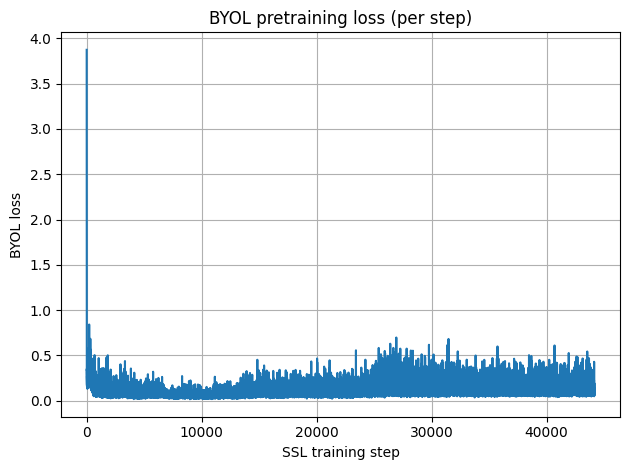

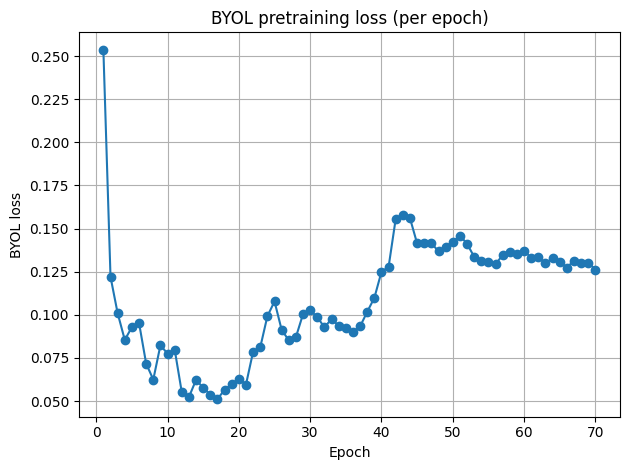

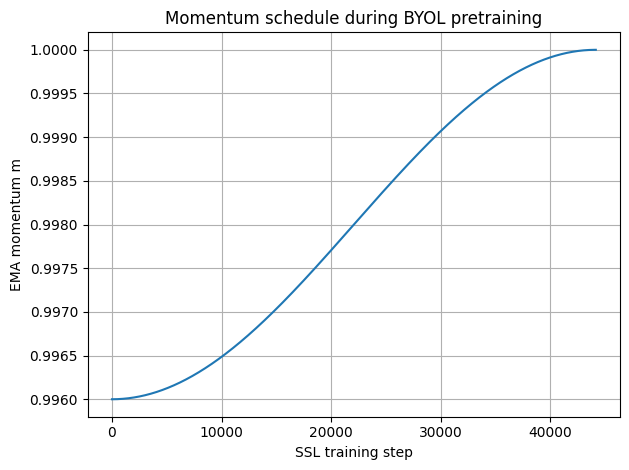

✓ Saved SSL backbone weights → /kaggle/working/palm_byol_ssl/byol_backbone_with_hooks_yolov12s.pt


In [14]:
import math
import gc
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import DataLoader


MODEL_CFG = "yolo12s.pt"

# BYOL pretraining
SSL_EPOCHS = 70
SSL_BATCH  = 8
m0         = 0.996  # base EMA momentum

# safer device flag
is_cuda = str(device).startswith("cuda")

if SSL_W.exists():
    print("✓ BYOL backbone cached – skipping pre-train:", SSL_W)
else:
    print("\n🔄  BYOL pre-training YOLOv12s backbone on augmented data")

    # Build full models (DetectionModel)
    online_full = YOLO(MODEL_CFG).model.to(device)
    target_full = YOLO(MODEL_CFG).model.to(device)
    target_full.load_state_dict(online_full.state_dict())
    for p in target_full.parameters():
        p.requires_grad = False
    target_full.eval()  # target network in eval mode

    # Register hooks on Detect heads to capture P3,P4,P5
    online_hook = DetectInputHook(get_detect_module(online_full))
    target_hook = DetectInputHook(get_detect_module(target_full))

    # Infer feature dim
    with torch.no_grad():
        dmy = torch.zeros(1, 3, BYOL_IMG_SIZE, BYOL_IMG_SIZE, device=device)
        _ = online_full(dmy)  # populate hook
        feat_dim = global_pool_concat(online_hook.feats).shape[1]
    print("Backbone feature dim:", feat_dim)

    # Projector & Predictor
    def projector():
        return nn.Sequential(
            nn.Linear(feat_dim, 512, bias=False),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Linear(512, 256, bias=False),
        )

    def predictor():
        return nn.Sequential(
            nn.Linear(256, 512, bias=False),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Linear(512, 256, bias=False),
        )

    proj_o = projector().to(device)
    proj_t = projector().to(device)
    pred_o = predictor().to(device)

    proj_t.load_state_dict(proj_o.state_dict())
    for p in proj_t.parameters():
        p.requires_grad = False
    proj_t.eval()  # target projector in eval mode

    # Optimize only online_full + proj_o + pred_o
    opt = torch.optim.AdamW(
        list(online_full.parameters()) +
        list(proj_o.parameters()) +
        list(pred_o.parameters()),
        lr=1e-3,
        weight_decay=1e-4,
    )
    scaler = torch.cuda.amp.GradScaler(enabled=is_cuda)

    @torch.no_grad()
    def ema_update(src, dst, m):
        for ps, pd in zip(src.parameters(), dst.parameters()):
            pd.data.mul_(m).add_(ps.data, alpha=1 - m)

    def momentum_scheduled(step, total_steps, base=m0):
        if total_steps <= 1:
            return 1.0
        tau = step / (total_steps - 1)
        return 1.0 - (1.0 - base) * (0.5 * (1.0 + math.cos(math.pi * tau)))

    # SSL dataset & dataloader
    ds = TwoView(ssl_image_dirs, byol_transform)
    dl = DataLoader(
        ds,
        batch_size=SSL_BATCH,
        shuffle=True,
        num_workers=0,
        pin_memory=False,
        drop_last=True,
    )

    # logging containers for plots
    ssl_step_losses  = []  # per batch
    ssl_epoch_losses = []  # per epoch avg
    ssl_momentum     = []  # EMA momentum per step

    total_steps = max(1, SSL_EPOCHS * len(dl))
    step = 0

    from tqdm import tqdm
    for ep in range(SSL_EPOCHS):
        online_full.train()
        proj_o.train()
        pred_o.train()
        running = 0.0
        n_batches = 0

        pbar = tqdm(dl, desc=f"BYOL {ep+1}/{SSL_EPOCHS}", leave=False)
        for v1, v2 in pbar:
            v1 = v1.to(device, non_blocking=True)
            v2 = v2.to(device, non_blocking=True)
            m_cur = momentum_scheduled(step, total_steps)

            with torch.autocast(device_type="cuda", enabled=is_cuda):
                # Online encodes
                _ = online_full(v1)
                h1 = global_pool_concat(online_hook.feats)
                _ = online_full(v2)
                h2 = global_pool_concat(online_hook.feats)

                z1_o = proj_o(h1)
                z2_o = proj_o(h2)
                p1   = pred_o(z1_o)
                p2   = pred_o(z2_o)

                # Target encodes (EMA, no grad)
                with torch.no_grad():
                    ema_update(online_full, target_full, m_cur)
                    ema_update(proj_o, proj_t, m_cur)
                    _ = target_full(v1)
                    h1_t = global_pool_concat(target_hook.feats)
                    _ = target_full(v2)
                    h2_t = global_pool_concat(target_hook.feats)
                    z1_t = proj_t(h1_t)
                    z2_t = proj_t(h2_t)

                loss = byol_loss(p1, z2_t) + byol_loss(p2, z1_t)

            scaler.scale(loss).backward()
            scaler.step(opt)
            scaler.update()
            opt.zero_grad(set_to_none=True)

            # logging
            loss_val = loss.item()
            running += loss_val
            n_batches += 1
            ssl_step_losses.append(loss_val)
            ssl_momentum.append(m_cur)

            step += 1
            pbar.set_postfix(loss=f"{loss_val:.4f}", m=f"{m_cur:.4f}")

        epoch_loss = running / max(1, n_batches)
        ssl_epoch_losses.append(epoch_loss)
        print(f"Epoch {ep+1}/{SSL_EPOCHS} BYOL loss={epoch_loss:.4f}")

    # Plotting BYOL training curves
    if len(ssl_step_losses) > 0:
        steps = np.arange(1, len(ssl_step_losses) + 1)

        # (A) BYOL loss per training step
        plt.figure()
        plt.plot(steps, ssl_step_losses)
        plt.xlabel("SSL training step")
        plt.ylabel("BYOL loss")
        plt.title("BYOL pretraining loss (per step)")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        # (B) BYOL loss per epoch
        epochs = np.arange(1, len(ssl_epoch_losses) + 1)
        plt.figure()
        plt.plot(epochs, ssl_epoch_losses, marker="o")
        plt.xlabel("Epoch")
        plt.ylabel("BYOL loss")
        plt.title("BYOL pretraining loss (per epoch)")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        # (C) EMA momentum schedule
        if len(ssl_momentum) == len(ssl_step_losses):
            plt.figure()
            plt.plot(steps, ssl_momentum)
            plt.xlabel("SSL training step")
            plt.ylabel("EMA momentum m")
            plt.title("Momentum schedule during BYOL pretraining")
            plt.grid(True)
            plt.tight_layout()
            plt.show()

   
    last_idx = len(online_full.model) - 1
    to_save = {
        k: v for k, v in online_full.state_dict().items()
        if not k.startswith(f"model.{last_idx}.")
    }
    torch.save(to_save, SSL_W)
    print("✓ Saved SSL backbone weights →", SSL_W)

    online_hook.close()
    target_hook.close()
    del online_full, target_full, proj_o, proj_t, pred_o, dl, ds
    gc.collect()
    if is_cuda:
        torch.cuda.empty_cache()

# Fine-tuning YOLOv12s

In [15]:
print("\n Fine-tuning YOLOv12s on augmented dataset (BYOL backbone)")


det = YOLO(MODEL_CFG)  


sd = torch.load(SSL_W, map_location="cpu")
det.model.load_state_dict(sd, strict=False)

# Train on augmented dataset (DATA_AUG)
det_run_name = "byol_yolov12s_aug"

train_results = det.train(
    data=str(DATA_AUG),
    epochs=70,                    
    imgsz=640,
    batch=8,
    project=str(WORK),
    name=det_run_name,
    device=0 if device == "cuda" else None,
    verbose=True,

  
    lr0=5e-4,                     
    lrf=1e-4,                    
    weight_decay=5e-4,           
    patience=7,                 
    cos_lr=True,                 
    # freeze=10,                  
)

# Validation
metrics = det.val(
    project=str(WORK),
    name=det_run_name,
    verbose=False,   
    plots=False,
    save_json=False,
)


 Fine-tuning YOLOv12s on augmented dataset (BYOL backbone)
Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/palm_byol_ssl/data_byol_augmented.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.0001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=byol_yolov12s_aug, nbs=64, nms=False, ops

# Evaluating val and Test

In [16]:
print("\n Evaluating …")

run_dir = WORK / det_run_name
best_pt = run_dir / "weights" / "best.pt"
best_model = YOLO(str(best_pt))

# Validation metrics (original DATA)
val_metrics = best_model.val(
    data=str(DATA),
    imgsz=640,
    split="val",
    batch=8,
    device=0 if device == "cuda" else None,
    verbose=False,
)

# Test metrics (original DATA)
test_metrics = best_model.val(
    data=str(DATA),
    imgsz=640,
    split="test",
    batch=8,
    device=0 if device == "cuda" else None,
    verbose=False,
)


def print_metrics(name, metrics):
    print(f"\n{name} metrics")
    try:
        # Newer Ultralytics API
        mp      = metrics.box.mp
        mr      = metrics.box.mr
        map50   = metrics.box.map50
        map5095 = metrics.box.map
        print(f"mP          : {mp:.4f}")
        print(f"mR          : {mr:.4f}")
        print(f"mAP@0.50    : {map50:.4f}")
        print(f"mAP@0.50:0.95: {map5095:.4f}")
    except AttributeError:
        try:
            mp, mr, map50, map5095 = metrics.mean_results()
            mf1 = (2 * mp * mr) / (mp + mr) if (mp + mr) > 0 else 0.0
            print(f"Precision (mP): {mp:.4f}")
            print(f"Recall (mR)   : {mr:.4f}")
            print(f"F1-Score      : {mf1:.4f}")
            print(f"mAP@0.50      : {map50:.4f}")
            print(f"mAP@0.50:0.95 : {map5095:.4f}")
        except Exception:
            print("Raw metrics object (API changed):")
            print(metrics)


print_metrics("Validation", val_metrics)
print_metrics("Test", test_metrics)


 Evaluating …
Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv12s summary (fused): 159 layers, 9,232,041 parameters, 0 gradients, 21.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2266.9±450.5 MB/s, size: 172.1 KB)
val: Scanning /kaggle/working/palm_byol_ssl/0_yolo_split/valid/labels... 200 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 200/200 1.6Kit/s 0.1s
val: New cache created: /kaggle/working/palm_byol_ssl/0_yolo_split/valid/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 9.4it/s 2.7s
                   all        200        608      0.921      0.905      0.961      0.754
Speed: 1.2ms preprocess, 5.7ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /kaggle/working/runs/detect/val
Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
val: Fast image access ✅ (ping: 0.0±0.0 m

# Learning curves 

Columns in results.csv: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']


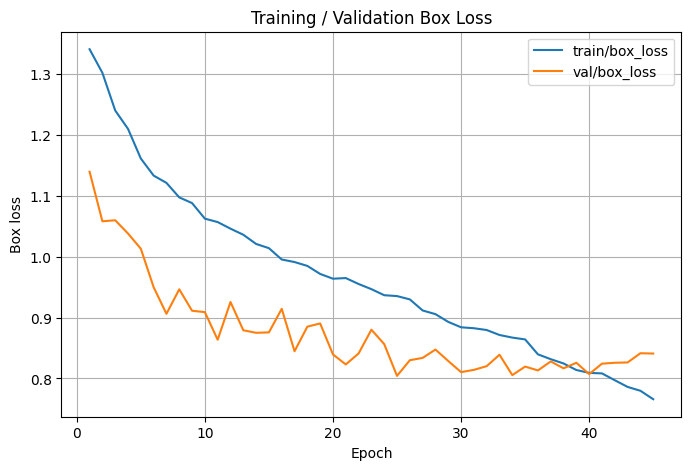

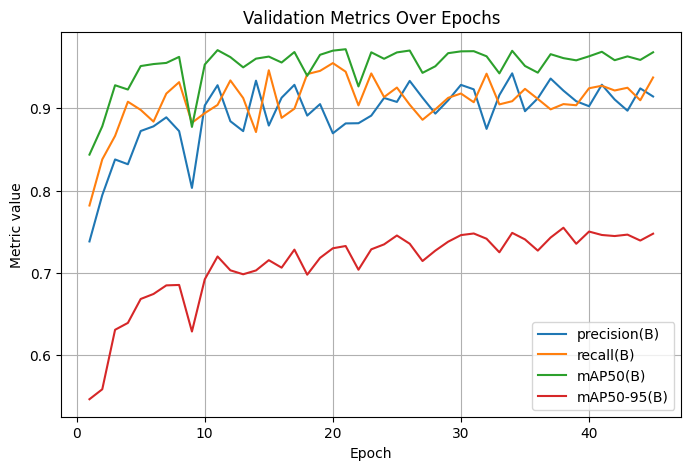

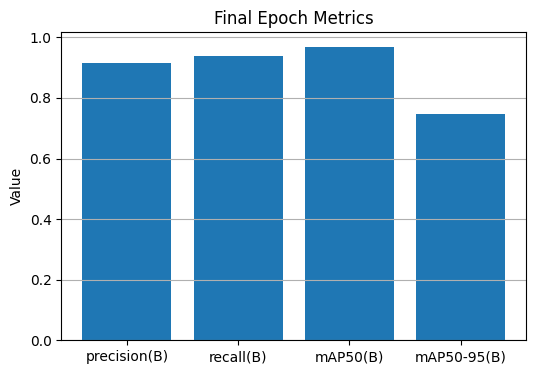

In [17]:
results_csv = run_dir / "results.csv"
df = pd.read_csv(results_csv)
print("Columns in results.csv:", df.columns.tolist())

#  Loss curves 
plt.figure(figsize=(8, 5))
plt.plot(df["epoch"], df["train/box_loss"], label="train/box_loss")
if "val/box_loss" in df.columns:
    plt.plot(df["epoch"], df["val/box_loss"], label="val/box_loss")
plt.xlabel("Epoch")
plt.ylabel("Box loss")
plt.title("Training / Validation Box Loss")
plt.legend()
plt.grid(True)
plt.show()

#  Metrics curves (precision, recall, mAP50, mAP50-95)
metric_cols = [
    "metrics/precision(B)",
    "metrics/recall(B)",
    "metrics/mAP50(B)",
    "metrics/mAP50-95(B)",
]
plt.figure(figsize=(8, 5))
for c in metric_cols:
    if c in df.columns:
        plt.plot(df["epoch"], df[c], label=c.split("/")[-1])
plt.xlabel("Epoch")
plt.ylabel("Metric value")
plt.title("Validation Metrics Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

#Final epoch bar chart of metrics 
last = df.iloc[-1]
vals = []
labels = []
for c in metric_cols:
    if c in df.columns:
        labels.append(c.split("/")[-1])
        vals.append(last[c])

plt.figure(figsize=(6, 4))
plt.bar(labels, vals)
plt.ylabel("Value")
plt.title("Final Epoch Metrics")
plt.grid(axis="y")
plt.show()

# confusion matrix images


 Running val with plots=True to get PR & confusion matrix images...
Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1616.1±155.1 MB/s, size: 187.0 KB)
val: Scanning /kaggle/working/palm_byol_ssl/0_yolo_split/valid/labels.cache... 200 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 200/200 269.4Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 9.4it/s 2.7s
                   all        200        608      0.921      0.905      0.961      0.754
Speed: 1.4ms preprocess, 6.1ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /kaggle/working/palm_byol_ssl/byol_yolov12s_valplots
PR curve file: /kaggle/working/palm_byol_ssl/byol_yolov12s_valplots/PR_curve.png
Confusion matrix file: /kaggle/working/palm_byol_ssl/byol_yolov12s_valplots/confusion_matrix.png
PR_curve.png not found, check valplots folder 

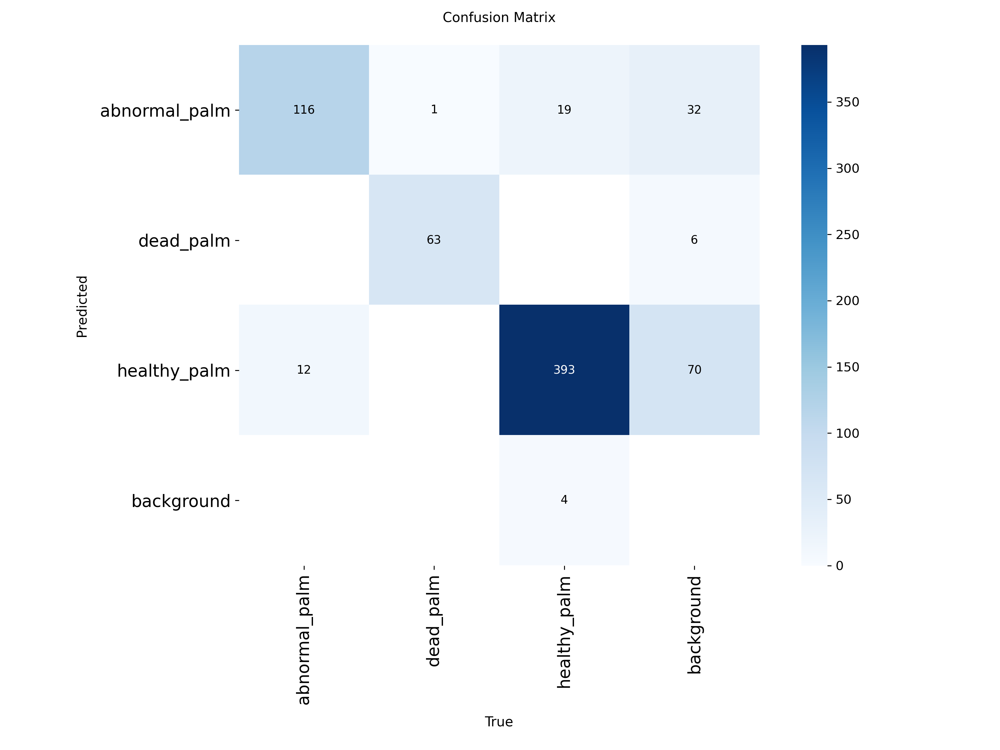

In [18]:
print("\n Running val with plots=True to get PR & confusion matrix images...")

val_plot_dir = WORK / "byol_yolov12s_valplots"
val_metrics_plots = best_model.val(
    data=str(DATA),
    imgsz=640,
    split="val",
    batch=8,
    device=0 if device == "cuda" else None,
    verbose=False,
    project=str(WORK),
    name="byol_yolov12s_valplots",
    plots=True,
)

# Typically Ultralytics saves these:
pr_curve_png        = val_plot_dir / "PR_curve.png"
confusion_matrix_png = val_plot_dir / "confusion_matrix.png"

print("PR curve file:", pr_curve_png)
print("Confusion matrix file:", confusion_matrix_png)

if pr_curve_png.exists():
    display(IPyImage(filename=str(pr_curve_png)))
else:
    print("PR_curve.png not found, check valplots folder content.")

if confusion_matrix_png.exists():
    display(IPyImage(filename=str(confusion_matrix_png)))
else:
    print("confusion_matrix.png not found, check valplots folder content.")

# Random detection grid on original test images

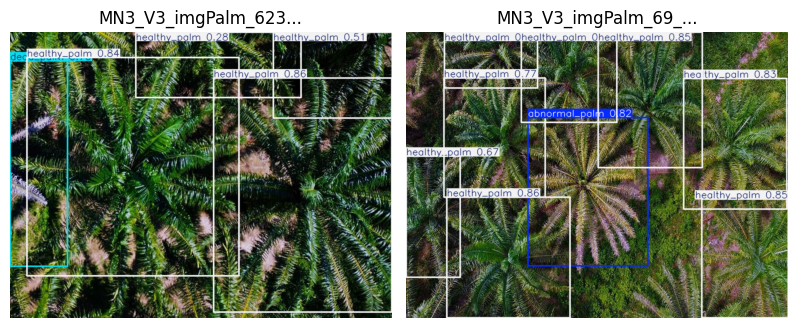

In [19]:
# Random detection grid on original test images
test_img_dir = SPLIT / "test" / "images"
all_test_imgs = sorted(
    list(test_img_dir.glob("*.jpg")) +
    list(test_img_dir.glob("*.png")) +
    list(test_img_dir.glob("*.jpeg"))
)

n_show = min(2, len(all_test_imgs))
sample_imgs = random.sample(all_test_imgs, n_show)

# Run prediction
preds = best_model.predict(
    source=[str(p) for p in sample_imgs],
    imgsz=640,
    conf=0.25,
    device=0 if device == "cuda" else None,
    verbose=False,
)

# Show in grid
cols = 4
rows = math.ceil(n_show / cols)
plt.figure(figsize=(4 * cols, 4 * rows))

for i, (p, r) in enumerate(zip(sample_imgs, preds)):
    img_vis = r.plot()  # returns BGR numpy array
    img_vis = cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img_vis)
    plt.title(p.name[:18] + "...")
    plt.axis("off")

plt.tight_layout()
plt.show()

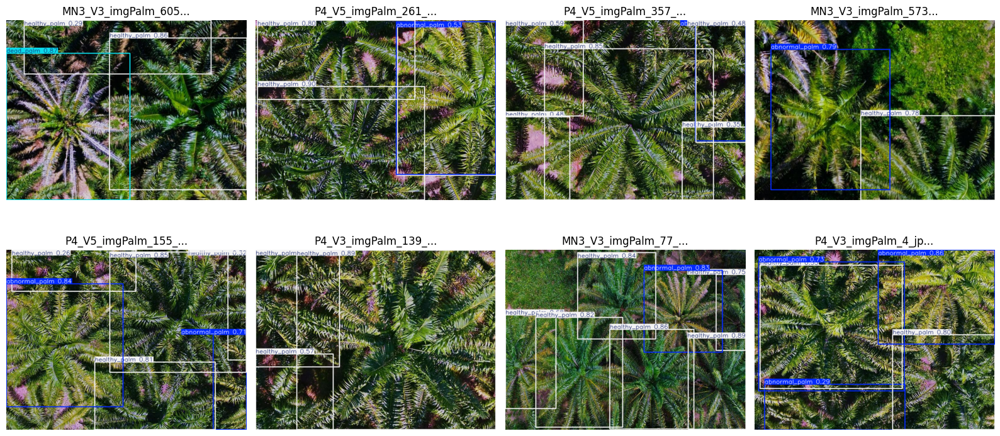

In [20]:
# Random detection grid on original test images
test_img_dir = SPLIT / "test" / "images"
all_test_imgs = sorted(
    list(test_img_dir.glob("*.jpg")) +
    list(test_img_dir.glob("*.png")) +
    list(test_img_dir.glob("*.jpeg"))
)

n_show = min(8, len(all_test_imgs))
sample_imgs = random.sample(all_test_imgs, n_show)

# Run prediction
preds = best_model.predict(
    source=[str(p) for p in sample_imgs],
    imgsz=640,
    conf=0.25,
    device=0 if device == "cuda" else None,
    verbose=False,
)

# Show in grid
cols = 4
rows = math.ceil(n_show / cols)
plt.figure(figsize=(4 * cols, 4 * rows))

for i, (p, r) in enumerate(zip(sample_imgs, preds)):
    img_vis = r.plot()  # returns BGR numpy array
    img_vis = cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img_vis)
    plt.title(p.name[:18] + "...")
    plt.axis("off")

plt.tight_layout()
plt.show()